# AirBnB Washington DC Project
## Part ii: Understanding the factors determining price of listing

## Data set: InsideAirBnB - Washington D.C.
### Lok Tin Kevin Chan

AirBnB is a platform economy that facilitate digital interactions between real estate owners and customers for short to mid-term stay. The aim of the project is to explore AirBnB's in Washington DC and gain a better understanding:

    1) What do users care about during their AirBnB Stay?
    2) What factors affect listing price of an AirBnB listing?

This second part of the project aims to understand what are the relationship that affects the price per night for listing in Washington DC by analysis the listings.csv file in InsideAirBnB dataset.

The <a href = http://insideairbnb.com/get-the-data.html>dataset</a> is collected through webscrapping publicly avaliable information on AirBnB website. As of the date analysis the data is updated to from 2015 to Septmber 2019.




In [15]:
# Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pandas_profiling
import geopandas as geopd
import seaborn as sns
import datetime as dt
import spacy 
import en_core_web_lg
import string
import nltk
import sklearn

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer 
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from wordcloud import WordCloud, STOPWORDS
from nltk.corpus import stopwords
from geopy.distance import geodesic
from collections import Counter
from math import sqrt
from xgboost import XGBRegressor
from spacy.lang.en.stop_words import STOP_WORDS
from scipy import sparse
from eli5 import show_weights

pd.options.mode.chained_assignment = None


In [3]:
# import dataset [listing.csv] for data cleaning and eda
 
df = pd.read_csv("../0_Data/listings.csv")

C:\Users\User\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (61,62) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [193]:
# Taking a peak at sample of the raw data 
df.head(5)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,3344,https://www.airbnb.com/rooms/3344,20190922191721,2019-09-22,"White House/Center City, 1 roommate",This listing is for one roommate in a 2BR/2BA ...,"You have found The One, but be sure to message...",This listing is for one roommate in a 2BR/2BA ...,none,This is the hottest neighborhood in D.C. at th...,...,t,f,moderate,f,f,2,1,1,0,0.09
1,3362,https://www.airbnb.com/rooms/3362,20190922191721,2019-09-22,"Convention Center Rowhouse & In Law: 2 Units, 4BR",An architect-designed rowhouse featuring a lar...,This listing features our 19th century Victori...,An architect-designed rowhouse featuring a lar...,none,NaN,...,t,f,strict_14_with_grace_period,f,f,5,5,0,0,1.32
2,3662,https://www.airbnb.com/rooms/3662,20190922191721,2019-09-22,Vita's Hideaway II,IMPORTANT NOTES * Carefully read and be sure t...,IMPORTANT NOTES * Airbnb keeps accurate track ...,IMPORTANT NOTES * Carefully read and be sure t...,none,We love that our neighborhood is up and coming...,...,f,f,moderate,f,f,3,0,3,0,0.35
3,3670,https://www.airbnb.com/rooms/3670,20190922191721,2019-09-22,Beautiful Sun-Lit U Street 1BR/1BA,Convenient location perfect for business trave...,"Sunny, bright private room. Includes a queen s...",Convenient location perfect for business trave...,none,We are nicely situated on a quiet residential ...,...,f,f,strict_14_with_grace_period,f,f,1,0,1,0,1.44
4,3686,https://www.airbnb.com/rooms/3686,20190922191721,2019-09-22,Vita's Hideaway,IMPORTANT NOTES * Carefully read and be sure t...,IMPORTANT NOTES * Airbnb keeps accurate track ...,IMPORTANT NOTES * Carefully read and be sure t...,none,We love that our neighborhood is up and coming...,...,f,f,moderate,f,f,3,0,3,0,0.66


### Metadata Information

id = unique ID for the listing

listing url = link to AirBnB listing

scrape id = Date and time it was scraped

name = Name of the listing

summary = brief description of the listing

Space = additional description

description = full description

neighborhood = Neighborhood where the listing is located

Cancellation policy = policy for cancellation

host_id = unique ID for host

host_name = host name

host_description = description of host

calculated_host_listings_count = number of listing assoicated with unique id for the host

latitude = latitude of location

longtitude = longtitude of location

property type = type of property

room type = type of room for rent

price = price per night for listing

bedrooms = number of bedrooms

bathrooms = number of bathrooms

beds = number of beds

number_of_reviews = total number of review left at listing

last review = Date of the lastest review



### Data cleaning

In [4]:
# data cleaning part i

# Only keeping columns that are interesting and relevant to analysis
df_clean = df.iloc[:,[0,4,5,19,21,24,28,32,39,48,49,51,52,53,54,55,56,60,82,85,86]]

# convert superhost to from t/f to 0 = false and 1 = true

df_clean['host_is_superhost'] = df_clean['host_is_superhost'].map({'t':1,'f':0})

# convert last review from object to date

df_clean['last_review'] = pd.to_datetime(df_clean['last_review'], format = "%Y-%M-%d")

# Convert price into numerical value by remove $ symbol

df_clean['price'] = df_clean['price'].replace('[\$,]', '', regex=True).astype(float)

# Shortening the Neightbourhood_clean by shortening the name 

neighbourhood_shortened = {'Downtown, Chinatown, Penn Quarters, Mount Vernon Square, North Capitol Street': 
                            'Downtown',
                            'Shaw, Logan Circle': 'Shaw', 
                            'Historic Anacostia': 'Anacostia', 
                            'Howard University, Le Droit Park, Cardozo/Shaw': 'Howard U', 
                            'Columbia Heights, Mt. Pleasant, Pleasant Plains, Park View': 'Columbia Heights',
                            'Capitol Hill, Lincoln Park': 'Capitol Hill', 
                            'Eastland Gardens, Kenilworth': 'Eastland Gardens',
                            'Ivy City, Arboretum, Trinidad, Carver Langston': 'Ivy City',
                            'Kalorama Heights, Adams Morgan, Lanier Heights': 'Adams Morgan',
                            'Dupont Circle, Connecticut Avenue/K Street': 'Dupont Circle',
                            'Cathedral Heights, McLean Gardens, Glover Park': 'Cathedral Heights',
                            'Brightwood Park, Crestwood, Petworth': 'Brightwood Park',
                            'Union Station, Stanton Park, Kingman Park': 'Union Station',
                            'Southwest Employment Area, Southwest/Waterfront, Fort McNair, Buzzard Point': 'Southwest',
                            'Edgewood, Bloomingdale, Truxton Circle, Eckington': 'Edgewood',
                            'Takoma, Brightwood, Manor Park': 'Takoma',
                            'Friendship Heights, American University Park, Tenleytown': 'Friendship Heights',
                            'Spring Valley, Palisades, Wesley Heights, Foxhall Crescent, Foxhall Village, Georgetown Reservoir': 
                            'Spring Valley',
                            'Capitol View, Marshall Heights, Benning Heights': 'Capitol View',
                            'Congress Heights, Bellevue, Washington Highlands': 'Congress Heights',
                            'Brookland, Brentwood, Langdon': 'Brookland',
                            'Colonial Village, Shepherd Park, North Portal Estates': 'Colonial Village',
                            'Sheridan, Barry Farm, Buena Vista': 'Sheridan',
                            'Lamont Riggs, Queens Chapel, Fort Totten, Pleasant Hill': 'Lamont Riggs',
                            'Georgetown, Burleith/Hillandale': 'Georgetown',
                            'Cleveland Park, Woodley Park, Massachusetts Avenue Heights, Woodland-Normanstone Terrace': 
                            'Cleveland Park',
                            'West End, Foggy Bottom, GWU': 'West End',
                            'North Cleveland Park, Forest Hills, Van Ness': 'Van Ness',
                            'Douglas, Shipley Terrace': 'Douglas',
                            'River Terrace, Benning, Greenway, Dupont Park': 'River Terrace',
                            'North Michigan Park, Michigan Park, University Heights': 'North Michigan Park',
                            'Hawthorne, Barnaby Woods, Chevy Chase': 'Hawthorne',
                            'Woodridge, Fort Lincoln, Gateway': 'Woodridge',
                            'Twining, Fairlawn, Randle Highlands, Penn Branch, Fort Davis Park, Fort Dupont': 'Twining',
                            'Fairfax Village, Naylor Gardens, Hillcrest, Summit Park': 'Fairfax Village',
                            'Deanwood, Burrville, Grant Park, Lincoln Heights, Fairmont Heights': 'Deanwood',
                            'Mayfair, Hillbrook, Mahaning Heights': 'Mayfair',
                            'Near Southeast, Navy Yard': 'Navy Yard',
                            'Woodland/Fort Stanton, Garfield Heights, Knox Hill': 'Woodland/Fort Stanton'}

df_clean['neighbourhood_cleansed'] = df_clean['neighbourhood_cleansed'].replace(neighbourhood_shortened)


In [5]:
# Data cleaning part ii

# Check for null values 

df_clean.isnull().sum()

# filling in the one single missing value of superhost (id:3890435 manual check)

df_clean['host_is_superhost'].fillna(0, inplace=True)

# filling in three missing names (id: 6984846, 8320890, 16269511 manual check )

df_clean.loc[df_clean['id'] == 6984846, 'name'] = 'Entire apartment hosted by Paula'
df_clean.loc[df_clean['id']==8320890, 'name'] = 'NA'
df_clean.loc[df_clean['id']==16269511, 'name'] ='Entire guesthouse hosted by Christina'

# filling in the one single missing host name and list count (id: 3890435 manual check) 

df_clean.loc[df_clean['id']==3890435, 'host_name'] ='Liz'
df_clean.loc[df_clean['id']==3890435, 'host_listings_count'] = 1

# filling in empty bathrooms, bedrooms, beds to be zero as meaning none is provided if NAN
df_clean['bathrooms'].fillna(0, inplace=True)
df_clean['bedrooms'].fillna(0, inplace=True)
df_clean['beds'].fillna(0, inplace=True)

df_clean['summary'].fillna("missing", inplace = True)

### Profile Report

From our profile report that are 9189 listing with 12 numerical variables, 7 categorical, 1 Date and 1 text after cleaning the dataset.

Taking a deeper look at the variables, it is interesting to note the following observations:

- There are 6076 distinct host with 49% of the host having only one listing and 14.7% having two listing. Interestingly though there is one host with 1795 listing (host name: Zeus)
-  45% of the listing has property type Apartment with entire aprtment room type (71%) to be most common for listing. 
-  distribution of listing across the neighbourhood are quite even with Columbia Heighs and Union station (~10%) 

Looking the correlation of Price to other variable, we can note that: 

- Price is positively correlated to accommodates, bathrooms, beds, bedrooms (which are related to size), number of listing per host (though maybe skewed by Zeus)
- more interestingly Price is negatively correlated to is whether host is superhost. Which may indicate that superhost are more realistic at pricing their listing. 



In [19]:
# Getting an idea of the distribution of the dataset
pandas_profiling.ProfileReport(df_clean)
# Correlation map is at the end of the report

### Explortatory Data Analysis 



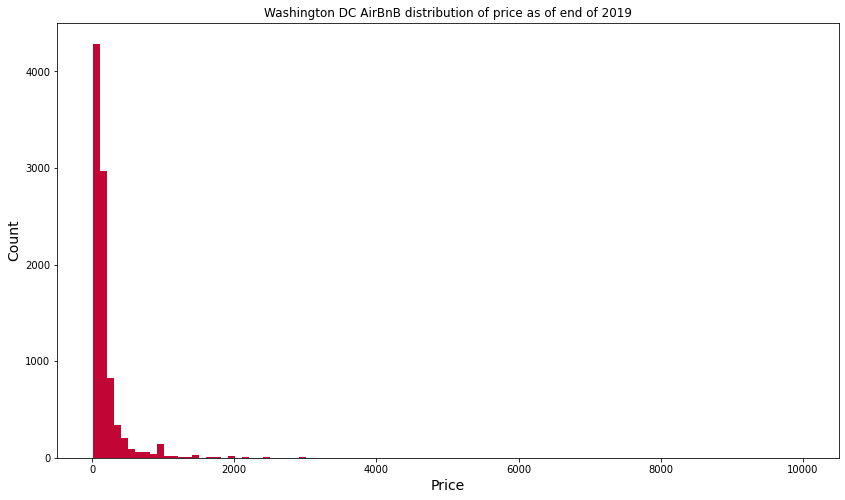

In [10]:
# First lets take a deeper look at price

#config the plot size for better display
plt.figure(figsize=(14, 8))

## distribution of price
plt.hist(df_clean['price'], bins = 100, color = '#c10534')
plt.title('Washington DC AirBnB distribution of price as of end of 2019')
plt.xlabel('Price', fontdict={'fontsize': 14})
plt.ylabel('Count', fontdict={'fontsize': 14});

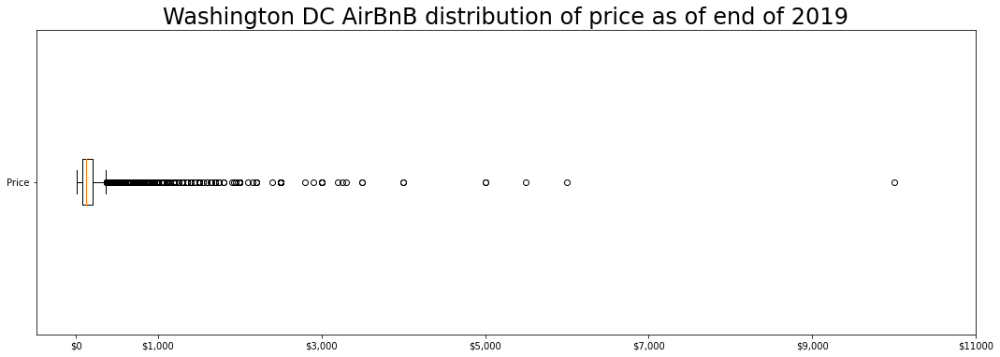

In [11]:
# Configure the plot area 
plt.figure(figsize=(18, 6))

#boxplot 
plt.boxplot(df_clean['price'], vert=False)
plt.title('Washington DC AirBnB distribution of price as of end of 2019', fontdict={'fontsize': 24})
plt.yticks(ticks=[1], labels=['Price'])
plt.xticks(ticks=[0, 1000, 3000, 5000, 7000, 9000, 11000], labels=['$0', '$1,000', '$3,000', '$5,000', '$7,000','$9,000','$11000']);

From the above bar and box chart, we can observe that majority of the listing has price in range between \\$0 to \\$600 and around 400 listing that has price per night greater than \\$600 dollars. Lets first take a look at listing that greater than \\$3000 to see whether there is a reasoning behind them.

In [12]:
# Lets take a look at listing greater than 3000
df_clean[df_clean['price'] > 3000]

,id,name,summary,host_id,host_name,host_about,host_is_superhost,host_listings_count,neighbourhood_cleansed,latitude,...,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,number_of_reviews,last_review,review_scores_rating
2215,12017374,Bright and Charming 2 Bedroom. Hear,"AVAILABLE: JUNE, JULY, AND AUGUST. Beautiful 2...",683757,Alison,My name is Alison Schuyler Ogden. Check me out...,0.0,1.0,Adams Morgan,38.92355,...,Apartment,Entire home/apt,4,1.0,2.0,2.0,3200.0,0,NaT,NaN
2747,14507861,Entire Capitol Hill Home - 5BR/4BA,Historic Federal Row Home on Safest Street on ...,19521188,Adrian,NaN,0.0,2.0,Capitol Hill,38.88389,...,House,Entire home/apt,12,3.0,4.0,8.0,5995.0,0,NaT,NaN
2844,15054700,Historic Georgetown Residence,Historic neoclassical empire four story home i...,95158537,Lindsey,NaN,0.0,1.0,Georgetown,38.90886,...,House,Entire home/apt,8,6.5,4.0,5.0,10000.0,0,NaT,NaN
3171,15996618,Large Capitol Hill 3B/3.5BA for the Inauguration!,Welcome to Capitol Hill for Inauguration weeke...,11077252,Emerson,NaN,0.0,1.0,Union Station,38.89776,...,House,Entire home/apt,10,3.5,3.0,5.0,4000.0,0,NaT,NaN
3602,16466316,Huge Home Presidential Inauguration week 2017,My place is close to DOWNTOWN WASHINGTON DC FO...,108042585,Hansel,NaN,0.0,1.0,Lamont Riggs,38.96371,...,House,Entire home/apt,10,3.5,4.0,4.0,3500.0,0,NaT,NaN
3671,16532102,Entire House at Centrally-located Logan Circle!,Our house is located in the historic Logan Cir...,37551897,Paula,Hi! We're the Luceros - we're a family of four...,0.0,1.0,Shaw,38.90946,...,House,Entire home/apt,8,2.0,4.0,4.0,4000.0,0,NaT,NaN
3820,16634189,Good Space for Good People,"Beautiful three bedroom penthouse duplex, 1900...",77013163,Janai,I'd like to share the comfort and peace I enjo...,0.0,1.0,Downtown,38.90248,...,Apartment,Entire home/apt,5,3.0,3.0,3.0,5500.0,0,NaT,NaN
3860,16661573,Inaguration Palace,"You'll love the short walk to downtown, the am...",18880505,Andrew,NaN,0.0,2.0,Shaw,38.91200,...,House,Entire home/apt,16,2.0,6.0,8.0,5000.0,0,NaT,NaN
3937,16709404,Walk to Inauguration from Our Hill Rowhouse!,Historic 3-story row house in the heart of Cap...,82205754,Nathan,NaN,0.0,1.0,Union Station,38.89277,...,House,Entire home/apt,8,2.5,4.0,4.0,3250.0,0,NaT,NaN
4024,16769736,Gorgeous Georgian embassy-like home in DC,Gorgeous modern Georgian home in an exclusive ...,49351903,Rosa,NaN,0.0,1.0,Spring Valley,38.92245,...,House,Entire home/apt,8,5.5,4.0,4.0,5000.0,0,NaT,NaN


From the above we can see that these listing are large houses / mansions that are for rent and that other than id: 32741852 that has 2 reviews, all other listing greater than \\$3000 per night has no review and compared to the 95 percentile of \\$197 per night can be considered as outlier for further eda on price to allow us to have a better understanding of price of AirBnB listing in DC without skewed by the outliers.

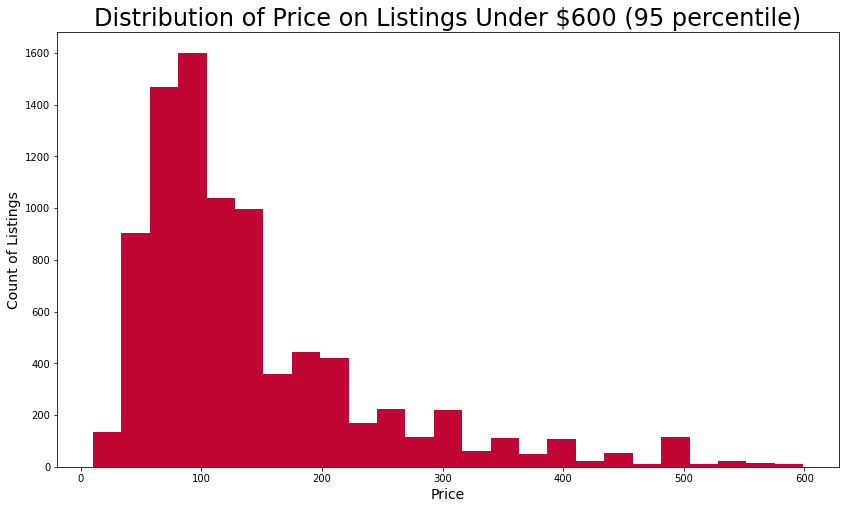

In [7]:
# Subset the dataframe to ignore outlier prices
df_c_price = df_clean[df_clean['price']<600]

# Configure the plot area for better viewing
plt.figure(figsize=(14, 8))

# Histrogram plot 
plt.hist(df_c_price['price'], bins=25, color='#c10534')
plt.title('Distribution of Price on Listings Under $600 (95 percentile)', fontdict={'fontsize': 24})
plt.xlabel('Price', fontdict={'fontsize': 14})
plt.ylabel('Count of Listings', fontdict={'fontsize': 14});

# Save the figure image to file
plt.savefig('../3_Figures/Price Histrogram.png')

# a right skewed distribution of price

### Location

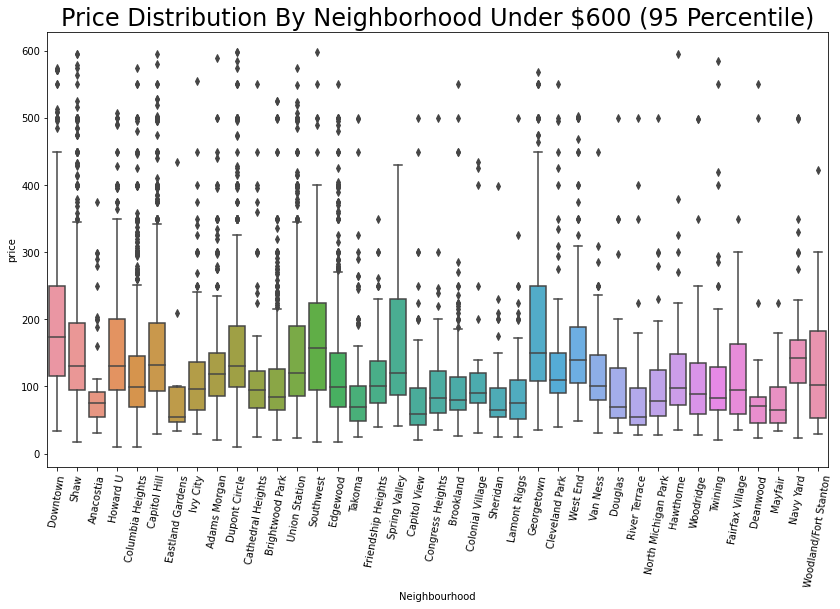

In [218]:
# Does Location affect the price? 

plt.figure(figsize=(14, 8))

#boxplot
sns.boxplot(x='neighbourhood_cleansed', y='price', data=df_c_price);
plt.title('Price Distribution By Neighborhood Under $600 (95 Percentile)', size=24)
plt.xticks(rotation=80)
plt.xlabel("Neighbourhood")

# save figure image to file
plt.savefig('../3_Figures/Price Box by neighborhood.png')



In [216]:
# Visalize the average price and standard deviation of Price by neighboorhood
# Calculate the average price per neighbourhood 
mean_Price = pd.DataFrame(df_c_price.groupby('neighbourhood_cleansed')['price'].mean().round(2)) 
# Calculate the std per neighbourhood
std_Price = pd.DataFrame(df_c_price.groupby('neighbourhood_cleansed')['price'].std().round(2))

# Read-in the geographic information in geojson file 
df_map = geopd.read_file('../0_Data/neighbourhoods.geojson')

# Replace the names to shortened version 
df_map['neighbourhood'] = df_map['neighbourhood'].replace(neighbourhood_shortened)

#Join the calculated values with geographic information 
df_map_ = df_map.set_index('neighbourhood').join(mean_Price)
df_map_2 = df_map.set_index('neighbourhood').join(std_Price)

# Calculate the coordinates of the each neighborhood
df_map['coords'] = df_map['geometry'].apply(lambda x: x.representative_point().coords[:])
df_map['coords'] = [coords[0] for coords in df_map['coords']]

<Figure size 1440x1440 with 0 Axes>

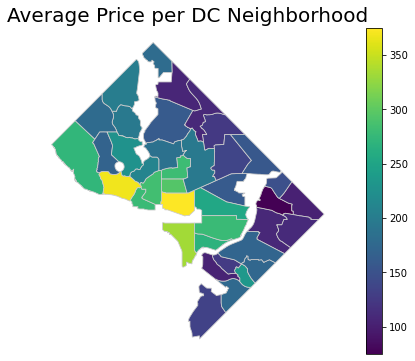

<Figure size 432x288 with 0 Axes>

In [213]:
## Average Price DC Map

# Define variables
variable = 'price'
tempt = 'neighbourhood'

# Configure the plot area for viewing
plt.figure(figsize=(20, 20))
fig, ax = plt.subplots(1, figsize=(10, 6))

# create map
df_map_.plot(column=variable, linewidth=0.8, ax=ax, edgecolor='0.8')

ax.axis('off')
ax.set_title('Average Price per DC Neighborhood', fontdict={'fontsize': '20', 'fontweight': '2'})

# Create colorbar as a legend 
vmin, vmax = 75, 375
sm = plt.cm.ScalarMappable( norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cbar = fig.colorbar(sm)


plt.show();

#save figure image to file
plt.savefig('../3_Figures/Average Price per neighborhood.png')

From the boxplot and the map, we can observe that most expensive neighboorhood on average for AirBnB is Georgetown and Southwest neighborhood followed by capital hill area, while the least expensive neightborhood on average is Mayfair. 

<Figure size 1440x1440 with 0 Axes>

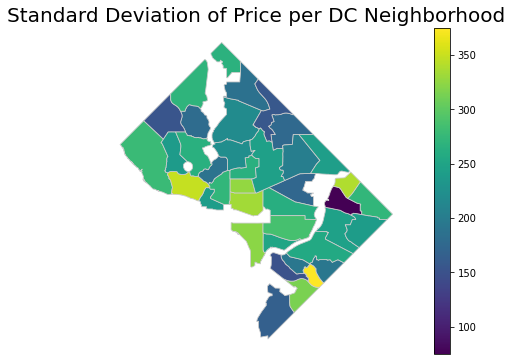

<Figure size 432x288 with 0 Axes>

In [215]:
## standard deviation of Price


# Define variables 
variable = 'price'
tempt = 'neighbourhood'


# Configure the plot area for viewing
plt.figure(figsize=(20, 20))
fig, ax = plt.subplots(1, figsize=(10, 6))

# Plot the map
df_map_2.plot(column=variable, linewidth=0.8, ax=ax, edgecolor='0.8')
ax.axis('off')
ax.set_title('Standard Deviation of Price per DC Neighborhood', fontdict={'fontsize': '20', 'fontweight': '2'})
vmin, vmax = 75, 375
sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cbar = fig.colorbar(sm)


plt.show();


#Save figure image to file
plt.savefig('../3_Figures/std Price per neighborhood.png')

Neighborhood with the largest standard deviation of price is Woodland/Fort Stanton (\\$129) and the least is Mayfair (\\$45)

From the above maps and charts, we can see that there seems to be a trend that closer the listing is to National Mall, the more expensive it is, thus we create a variable to calculate the distanc from of the listing to national mall (in miles).

In [217]:
# Calculate distance from the National Mall to each Airbnb and use that as a variable

# define lat and long of the national mall (coordinates taken from Google maps)
lat_nationalmall = 38.889770
lon_nationalmall = -77.023653

df_c_price['lat_nationalmall'] = lat_nationalmall
df_c_price['lon_nationalmall'] = lon_nationalmall

# create a new column that displays the distance between the listing and the national mall using vincenty forumla
df_c_price['distance_mall'] = df_c_price.apply(lambda x: geodesic((x['latitude'], x['longitude']), 
                                                              (lat_nationalmall, lon_nationalmall)).miles, axis=1)

df_c_price.drop(['lat_nationalmall','lon_nationalmall'], axis = 1, inplace = True)

# The distance to mall shows negative correlation, thus the farther away from national mall the more expensive it is though not very strong.
np.corrcoef(df_c_price['price'],df_c_price['distance_mall'])

array([[ 1.        , -0.22719722],
       [-0.22719722,  1.        ]])

### Room Type and Apartment Type


In [18]:
# Does the room type / apartment type affect price as well?
df_c_price.groupby('room_type').id.count()

room_type
Entire home/apt    6103
Hotel room           51
Private room       2334
Shared room         206
Name: id, dtype: int64

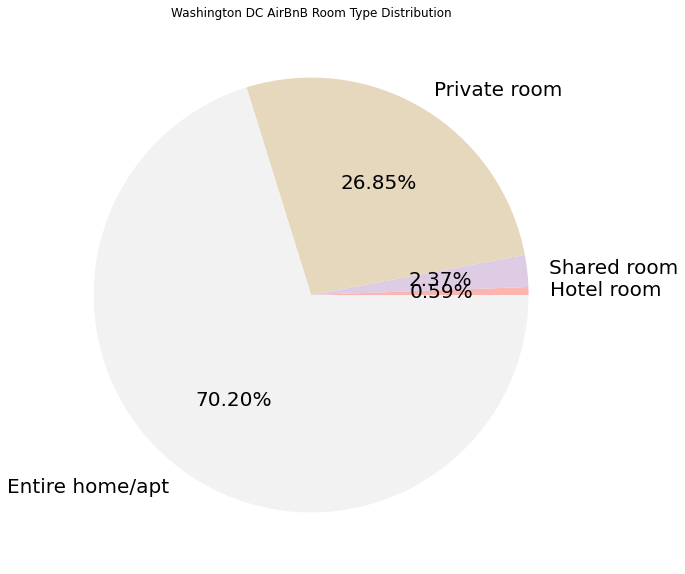

In [19]:
#Declare variable 
room = df_c_price.room_type
r = Counter(room)

#piechart 
room_df = pd.DataFrame.from_dict(r, orient='index').sort_values(by=0)
room_df.columns = ['room_type']
room_df.plot.pie(y = 'room_type', 
                 colormap = 'Pastel1', 
                 figsize=(10,10), 
                 fontsize = 20, autopct = '%.2f%%',
                 legend = False,
                 title = 'Washington DC AirBnB Room Type Distribution')
#remove y label
plt.ylabel("")

#save figure image to file
plt.savefig('../3_Figures/roomtype.png')

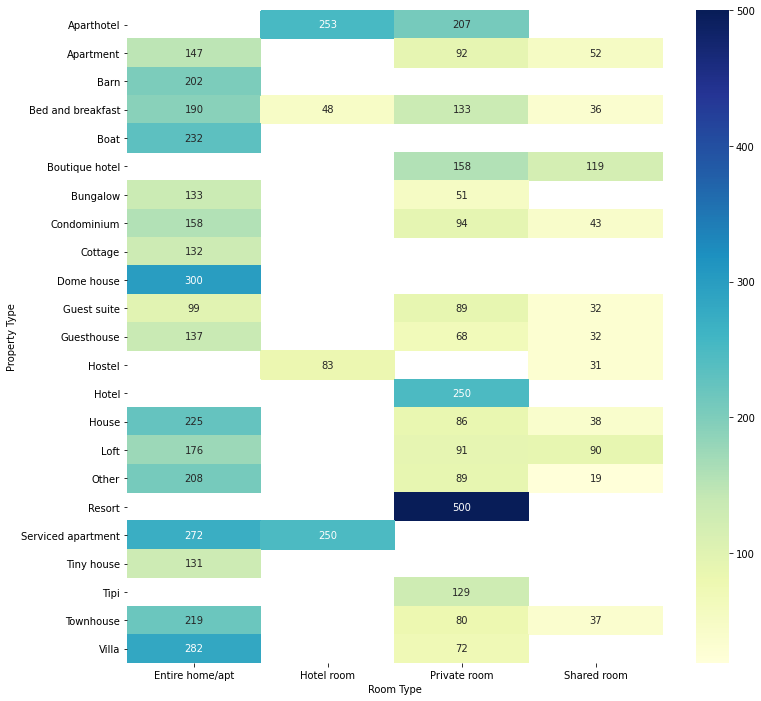

In [21]:
# Heatmap of room type and property type and its relationship to price

# configure the area for viewing
plt.figure(figsize=(12,12))

# heatmap 
sns.heatmap(df_c_price.groupby([
        'property_type', 'room_type']).price.mean().unstack(),annot=True, fmt=".0f", cmap="YlGnBu")
plt.ylabel('Property Type')
plt.xlabel('Room Type')
plt.savefig('../3_Figures/heatmap1.png')

The above heatmap all the listing price broken down by property type and room type. This chart gives us a much better understanding of the price breakdown in DC based on property type and room type.  It can be observed that private room in resort type is the most expensive. For property type that Entire home/aprt for those that have the option is the most expensive as expected. 

Property type and room type plays a strong role in deciding price of a listing.

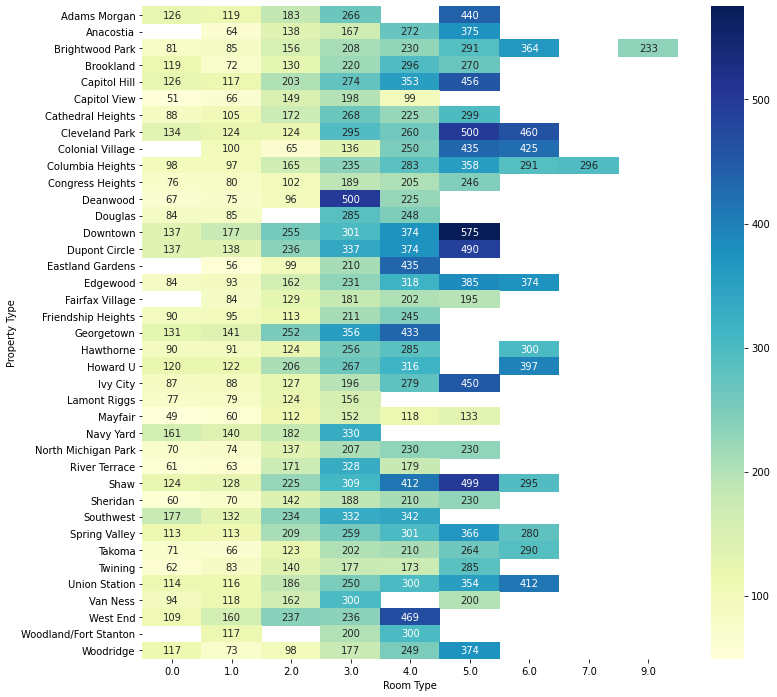

In [22]:
# Configure the area for viewing
plt.figure(figsize=(12,12))

# Heatmap 
sns.heatmap(df_c_price.groupby([
        'neighbourhood_cleansed', 'bedrooms']).price.mean().unstack(),annot=True, fmt=".0f", cmap="YlGnBu")
plt.ylabel('Property Type')
plt.xlabel('Room Type')

# save figure image to file 
plt.savefig('../3_Figures/heatmap2.png')

It can be analyzed that with the increase in the number of bedrooms price of listing increases.Although, it depends upon the neighbourhood as well.

### Summary

What are the most commonly used phase in summary that host use to catch the eye of end users?  

In [21]:
# Subset the dataframe and organize 
summaryDF = df_c_price[['summary','price']]
summaryDF = summaryDF[pd.notnull(summaryDF['summary'])]
summaryDF = summaryDF[summaryDF['summary']!=0]
# Sort the subset by ascending order of price
summaryDF = summaryDF.sort_values('price',ascending=[0])

words=''
for index,row in summaryDF.iterrows():
    words += row['summary']

# Clean the summary for wordcloud
string_punctuation = string.punctuation #Remove puncuation
ignoreChar=['\r','\n','',' ',"'s","dc"] #ignore characters 
nums=['0','1','2','3','4','5','6','7','8','9'] #ignore numbers
summary_data=nltk.word_tokenize(words) 
words_only = [l.lower() for l in summary_data if l not in string_punctuation if l not in ignoreChar if l not in nums]
filtered_data=[word for word in words_only if word not in stopwords.words('english')] #Remove stop words
wnl = nltk.WordNetLemmatizer() 
final_data=[wnl.lemmatize(data) for data in filtered_data]
final_words=' '.join(final_data)

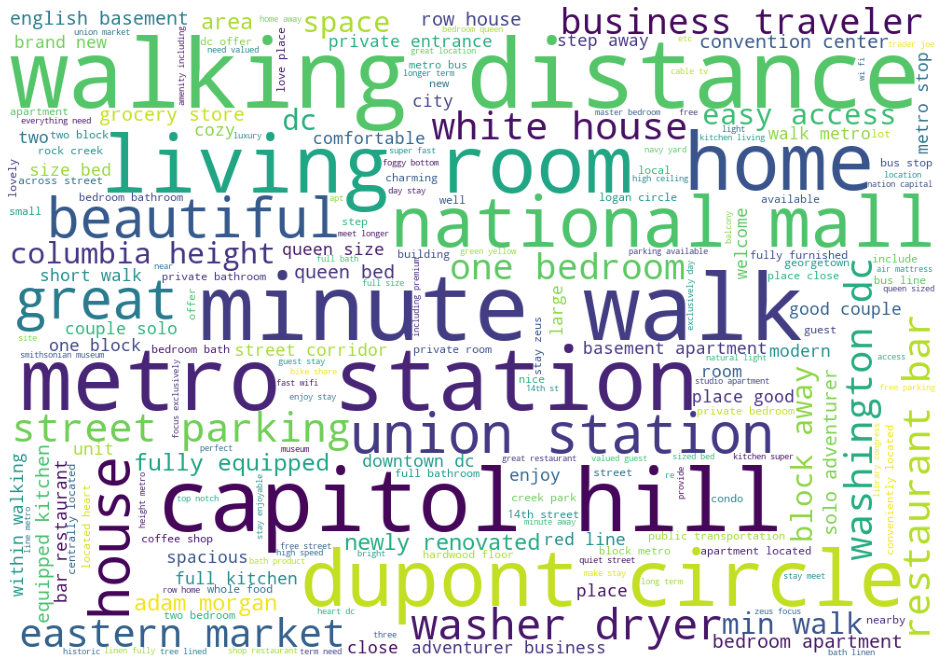

<Figure size 432x288 with 0 Axes>

In [22]:
# Generate the wordcloud 
wordcloud = WordCloud(width = 1000, height = 700,  background_color='white').generate(final_words)

#config the area for viewing 
plt.figure(figsize=(18,12))

#plot the wordcloud
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

# save the wordcloud image to file
plt.savefig('../3_Figures/wordcloud.png')

From the above word cloud, we can see that in summary section, most host owners that has a higher price list mentions most about it's location relative to sightseeing spots (e.g. National Mall, Capital Hill), transport (metro station) then followed by amenities it provides. This thus further emphasis that location, location and location matters strongly when determining the price per night for AirBnB listings in Washington DC. 

### Prediction Model of Price

The following below is a simple attempt at modelling price with the dataset though it is quite sub-par and should be improved in future iterations. 

In [8]:
# Subset the data into modelable data (dropping id, name, dates)
df_model = df_c_price.drop(['id','name','summary','host_id','host_name','host_about','last_review'], axis = 1)
# Add dummy variables to neighbourhood, property type and roomtype
df_model = pd.get_dummies(df_model, columns=["neighbourhood_cleansed","property_type",'room_type'])

# show the summary stats for the subset dataset
df_model.describe().T

,count,mean,std,min,25%,50%,75%,max
host_is_superhost,8694.0,0.340695,0.473970,0.00000,0.000000,0.000000,1.00000,1.00000
host_listings_count,8694.0,51.161261,240.116399,0.00000,1.000000,2.000000,4.00000,1795.00000
latitude,8694.0,38.912190,0.023578,38.82037,38.899513,38.911470,38.92523,38.99549
longitude,8694.0,-77.017407,0.029267,-77.12128,-77.036560,-77.019955,-76.99698,-76.90482
accommodates,8694.0,3.595698,2.258918,1.00000,2.000000,3.000000,4.00000,17.00000
...,...,...,...,...,...,...,...,...
property_type_Villa,8694.0,0.000920,0.030322,0.00000,0.000000,0.000000,0.00000,1.00000
room_type_Entire home/apt,8694.0,0.701978,0.457415,0.00000,0.000000,1.000000,1.00000,1.00000
room_type_Hotel room,8694.0,0.005866,0.076370,0.00000,0.000000,0.000000,0.00000,1.00000
room_type_Private room,8694.0,0.268461,0.443184,0.00000,0.000000,0.000000,1.00000,1.00000


In [10]:
# Let y = Price
y = df_model['price'].values

#Remove Price from subset dataset
del df_model['price']

# Let x be the remainig chosen values
X  = df_model.values

In [18]:
# Model using XGBOOST 
xgb_model = XGBRegressor(n_estimators= 150,
 max_depth=5)

kfold = KFold(n_splits=10, random_state=1994)
results = cross_val_score(xgb_model, X, y, cv=kfold)


# Get the model training score
print("Accuracy: %.2f%% (%.2f%%)" % (results.mean()*100, results.std()*100))

C:\Users\User\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:297: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


[08:38:38] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:38:40] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:38:42] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:38:44] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:38:46] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:38:48] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:38:50] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:38:52] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:38:54] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

Tested including Document Term Matrix with summary and yield a similar results (as summary maybe already capture by distance and neighboorhood factors) 

For future improvements:
- Conduct parameter tuning for XGBoost
- Conduct test with different models
- Conduct ensemble learning 